In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

In [2]:
def set_cols(data):
    cols = data.columns
    new_cols=[]
    for i in cols:
        if('-' in i):
            if(dt.datetime.strptime(i, '%Y-%m-%d') >= dt.datetime.strptime('2020-12-24', '%Y-%m-%d') and dt.datetime.strptime(i, '%Y-%m-%d') <= dt.datetime.strptime('2021-07-07', '%Y-%m-%d')):
                new_cols.append(i)
        else:
            if( i != "Region" and i != "Codigo region" and i != "Codigo comuna"):  
                new_cols.append(i)
    
    return data[new_cols]

def set_rows(data):
    return data[data['Poblacion'].notnull()]

def sum_semana(data):
    new_Data = pd.DataFrame()
    new_Data['Comuna'] = data.loc[:,'Comuna'] 
    data = data.drop(['Comuna', 'Poblacion'], axis=1)

    cols = list(data.columns)
    new_cols=[]
    for i in range(0,4):
        new_cols.append(cols[0])
        cols.pop(0)
    new_Data[new_cols[0]] = data[new_cols].sum(axis=1)
    new_cols=[]
    while(len(cols)>0):
        col_name=cols[0]
        if(len(cols)>=7):
            for i in range(0,7):
                new_cols.append(cols[0])
                cols.pop(0)
            new_Data[col_name] = data[new_cols].sum(axis=1)
        else:
            for i in range(0,len(cols)):
                new_cols.append(cols[0])
                cols.pop(0)
            new_Data[col_name] = data[new_cols].sum(axis=1)
    
    return new_Data
    
def orden_pregrafic(data):
    data = data.transpose()
    data.columns = data.iloc[0]
    data = data.drop(data.index[0])
    return data

def graficar(data):
    ax = data[list(data.columns)].plot(marker="o")
    ax.legend(loc="center left", bbox_to_anchor=(1,0.5))
    plt.show()
    

In [3]:
 # obtenemos los datos           
muertesComuna = pd.read_csv('DefuncionesDEIS_confirmadosPorComuna.csv')
vacunasD1Comuna = pd.read_csv('vacunacion_comuna_1eraDosis.csv')
vacunasD2Comuna = pd.read_csv('vacunacion_comuna_2daDosis.csv')
vacunasUDComuna = pd.read_csv('vacunacion_comuna_UnicaDosis.csv')

In [4]:
"""arreglamos los datos con set cols dejamos solo las columnas que nos sirven
aqui filtramos las fechas anteriores al 24-12-2020 y datos no utiles
en set rows eliminamos filas como desconosidos de cada region y filas no utiles
"""
muertesComuna = set_rows(set_cols(muertesComuna))
vacunasD1Comuna = set_rows(set_cols(vacunasD1Comuna))
vacunasD2Comuna = set_rows(set_cols(vacunasD2Comuna))
vacunasUDComuna = set_rows(set_cols(vacunasUDComuna))

In [5]:
""" aqui en sum semana, agrupamos los datos por cada semana
aqui se parte del 24-12-2020 el cual es dia jueves por lo que 
solo tiene 4 dias la primera semana
luego se agrupan cada 7 dias menos la ultima que no alcanzan a ser 7 dias menos
dado esto, se suman esas filas correspondientes para obtener las muertes por semana
y las vacunas por semana de cada comuna"""
muertesComuna = sum_semana(muertesComuna)
vacunasD1Comuna = sum_semana(vacunasD1Comuna)
vacunasD2Comuna = sum_semana(vacunasD2Comuna)
vacunasUDComuna = sum_semana(vacunasUDComuna)

In [6]:

"""ahora transponemos las tablas para poder graficar mas facilmente"""
muertesComuna=orden_pregrafic(muertesComuna)
vacunasD1Comuna=orden_pregrafic(vacunasD1Comuna)
vacunasD2Comuna=orden_pregrafic(vacunasD2Comuna)
vacunasUDComuna=orden_pregrafic(vacunasUDComuna)
muertesComuna.head()

Comuna,Arica,Camarones,General Lagos,Putre,Alto Hospicio,Camina,Colchane,Huara,Iquique,Pica,...,Cabo de Hornos,Laguna Blanca,Natales,Porvenir,Primavera,Punta Arenas,Rio Verde,San Gregorio,Timaukel,Torres del Paine
2020-12-24,2.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,6.0,1.0,...,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2020-12-28,4.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,6.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2021-01-04,15.0,0.0,0.0,0.0,5.0,0.0,0.0,1.0,15.0,0.0,...,0.0,0.0,4.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0
2021-01-11,22.0,0.0,0.0,0.0,11.0,0.0,0.0,1.0,28.0,0.0,...,0.0,0.0,4.0,0.0,0.0,17.0,0.0,0.0,0.0,0.0
2021-01-18,27.0,0.0,0.0,0.0,14.0,0.0,0.0,1.0,45.0,0.0,...,0.0,0.0,6.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0


In [7]:
muertesComuna.keys()

Index(['Arica', 'Camarones', 'General Lagos', 'Putre', 'Alto Hospicio',
       'Camina', 'Colchane', 'Huara', 'Iquique', 'Pica',
       ...
       'Cabo de Hornos', 'Laguna Blanca', 'Natales', 'Porvenir', 'Primavera',
       'Punta Arenas', 'Rio Verde', 'San Gregorio', 'Timaukel',
       'Torres del Paine'],
      dtype='object', name='Comuna', length=346)

In [8]:
muertes = muertesComuna['Arica'].values.reshape(-1,1)
vacunas = vacunasD1Comuna['Arica'].values.reshape(-1,1)
linear_regressor = LinearRegression()
linear_regressor.fit(vacunas, muertes)
muertes_pred= linear_regressor.predict(vacunas)
muertes_pred

array([[ 13.84335571],
       [ 13.84335571],
       [ 13.84335571],
       [ 13.84335571],
       [ 18.80232598],
       [ 18.80232598],
       [ 30.86590796],
       [ 54.54446942],
       [ 73.52835354],
       [ 88.33397483],
       [ 97.94415321],
       [109.06010588],
       [122.46254028],
       [134.71912566],
       [143.92069323],
       [151.5834499 ],
       [158.9662647 ],
       [165.2588711 ],
       [170.19523738],
       [178.25964977],
       [188.71660884],
       [200.19596431],
       [219.36415798],
       [227.06169004],
       [240.23112935],
       [253.34145049],
       [263.64192032],
       [266.86907629],
       [269.95713072]])

/var/folders/ym/np8l_00934jdy30wxxfgwdwc0000gn/T/ipykernel_10105/816777342.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(14,14))


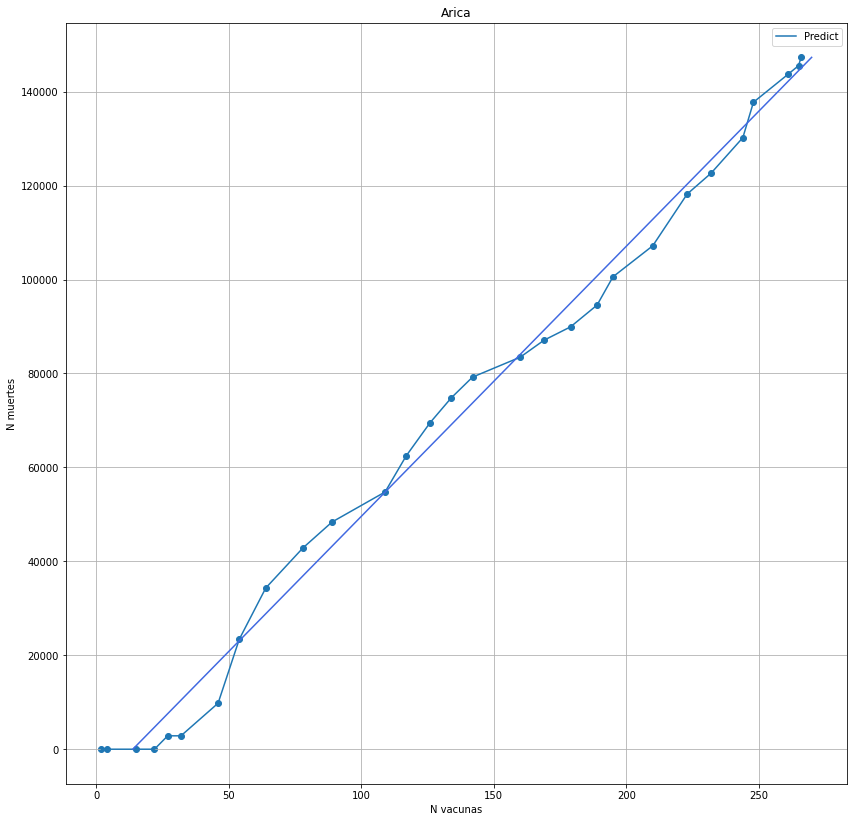

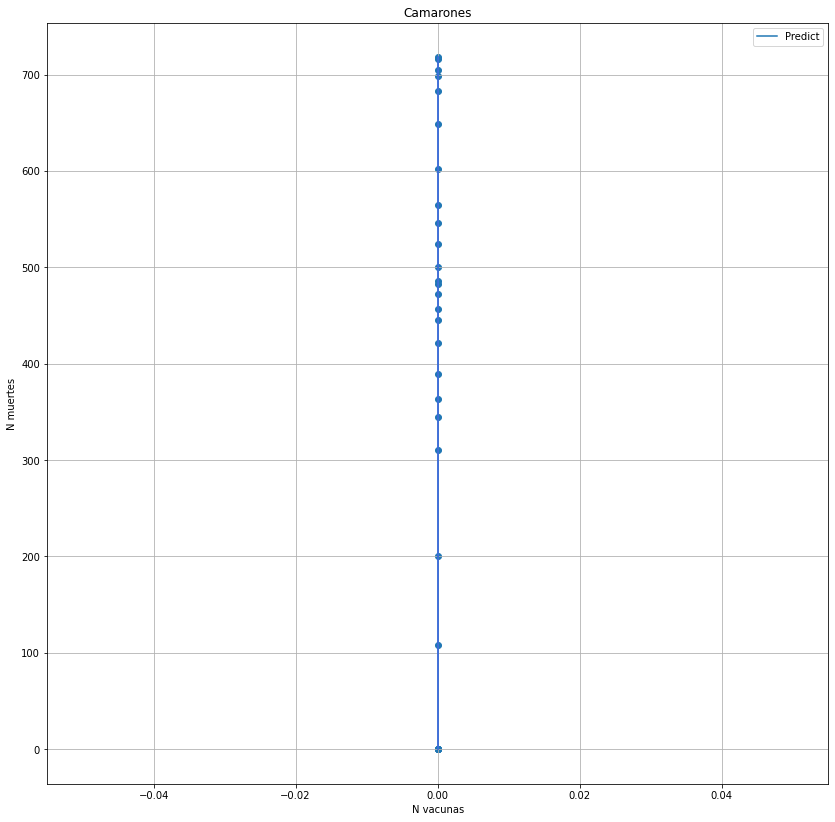

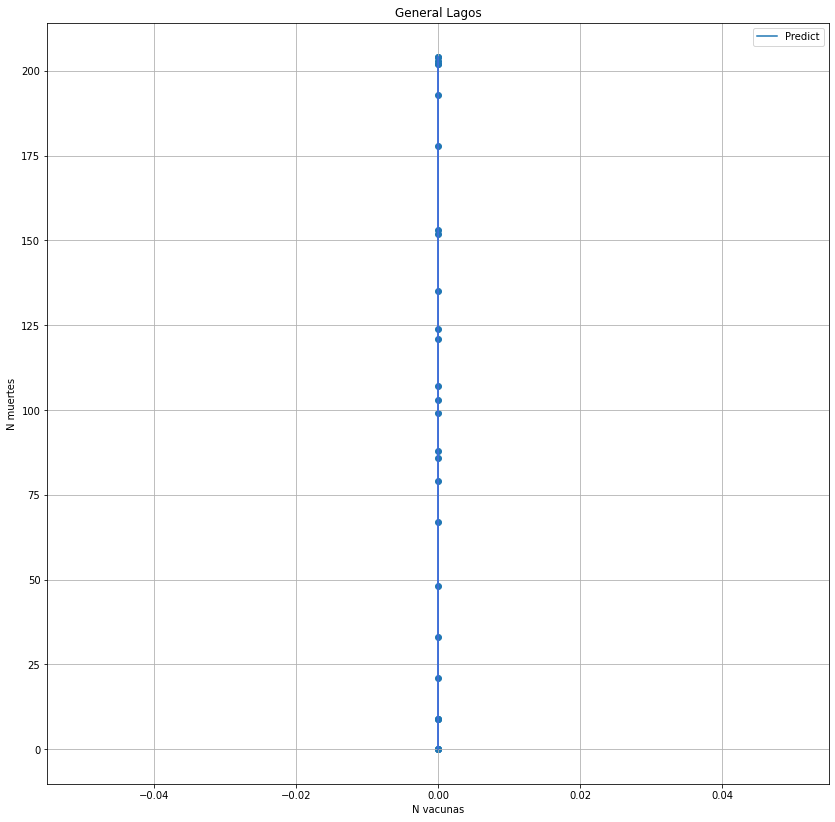

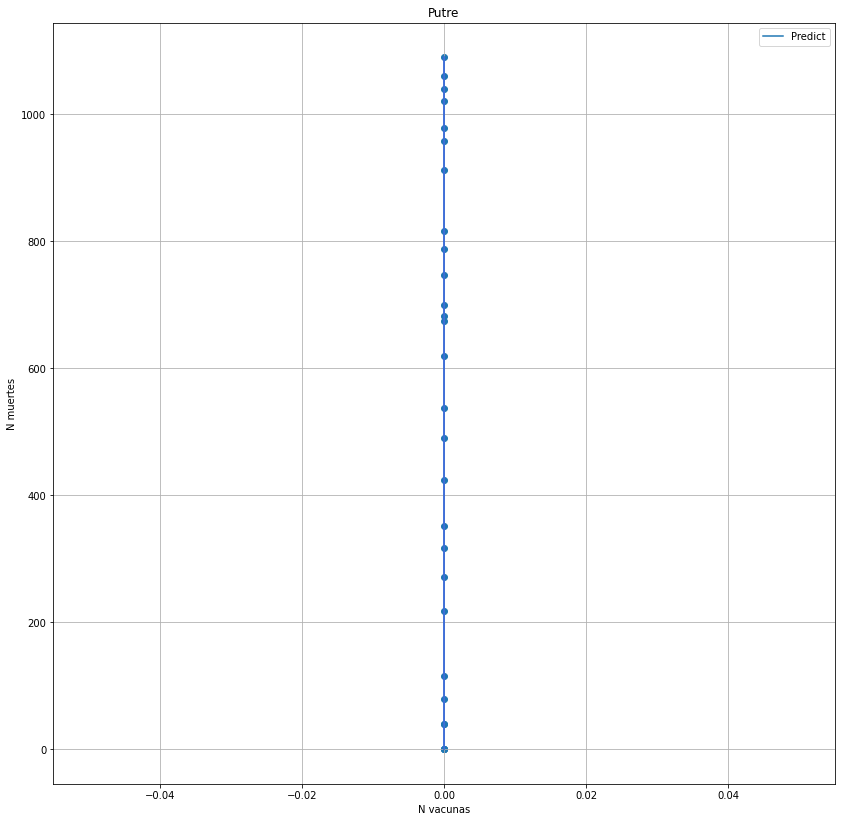

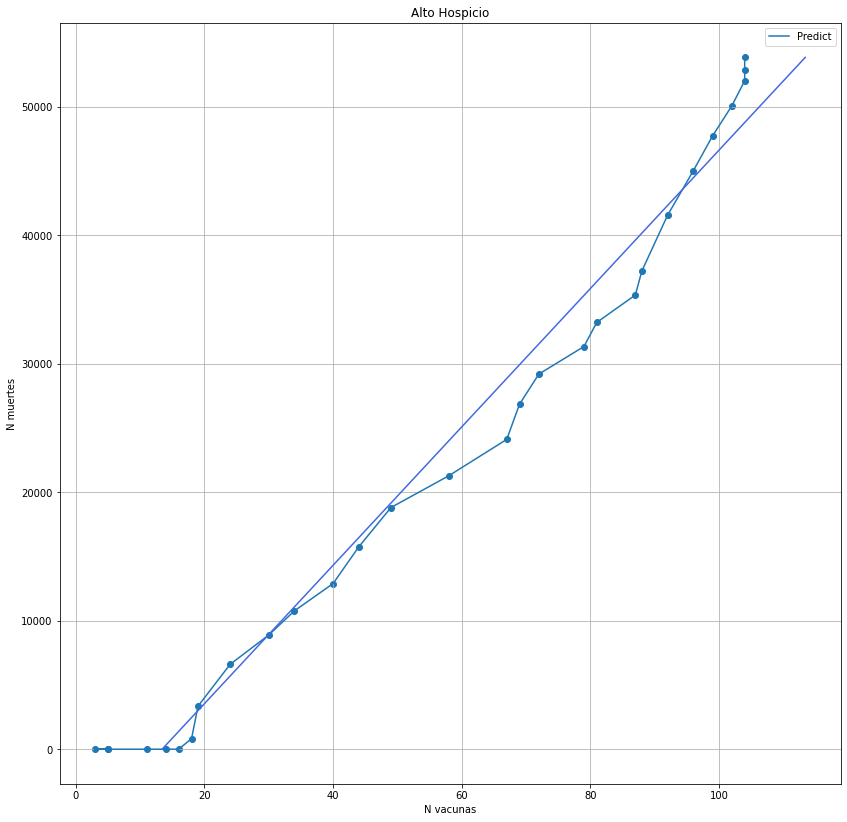

...

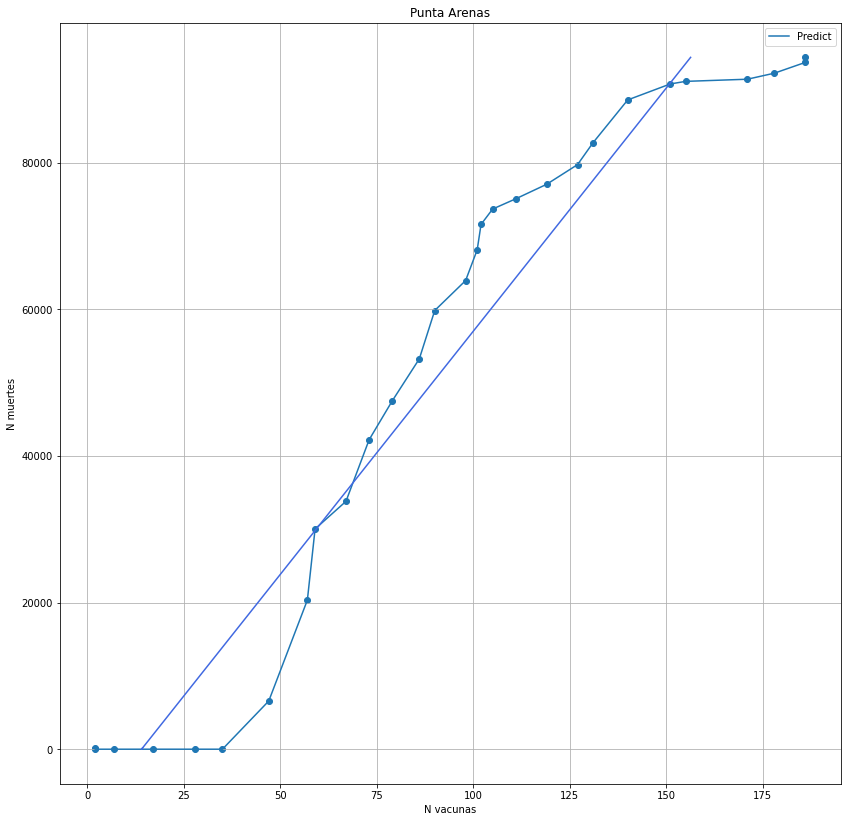

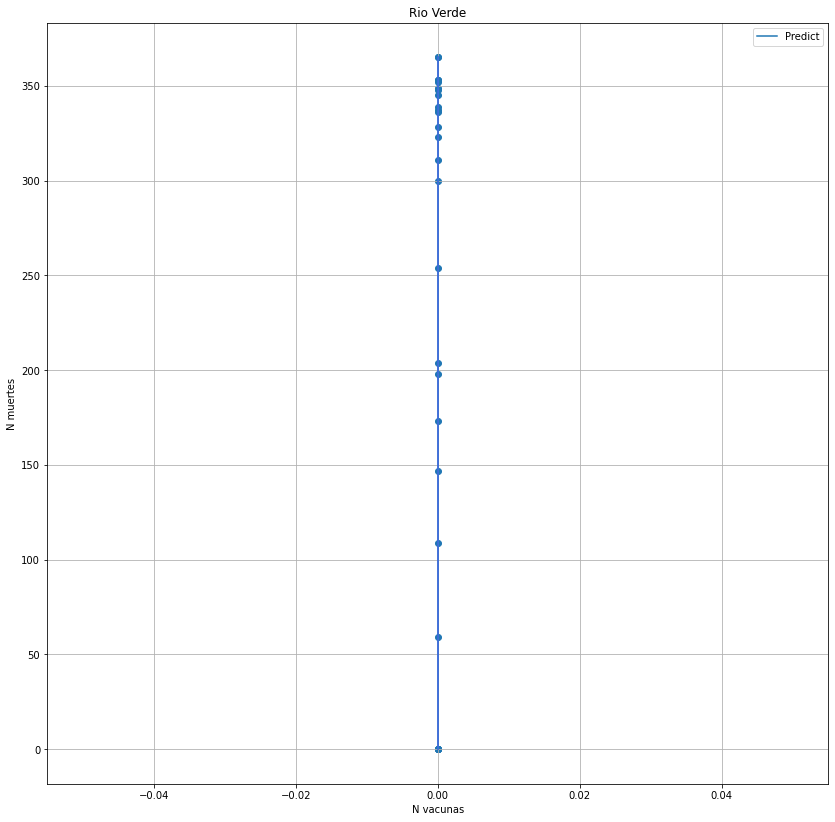

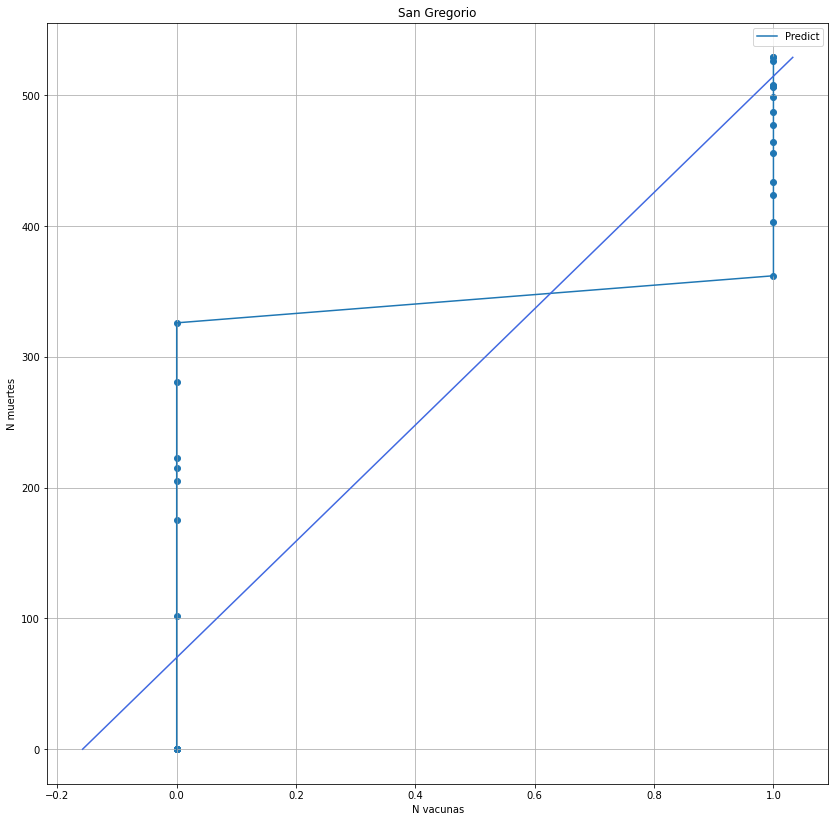

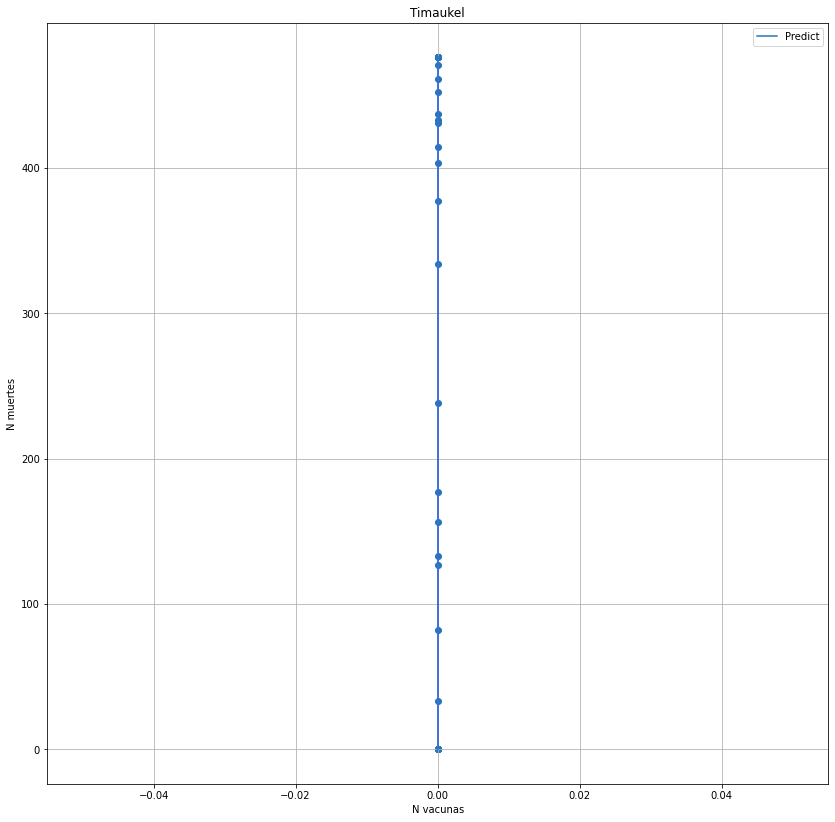

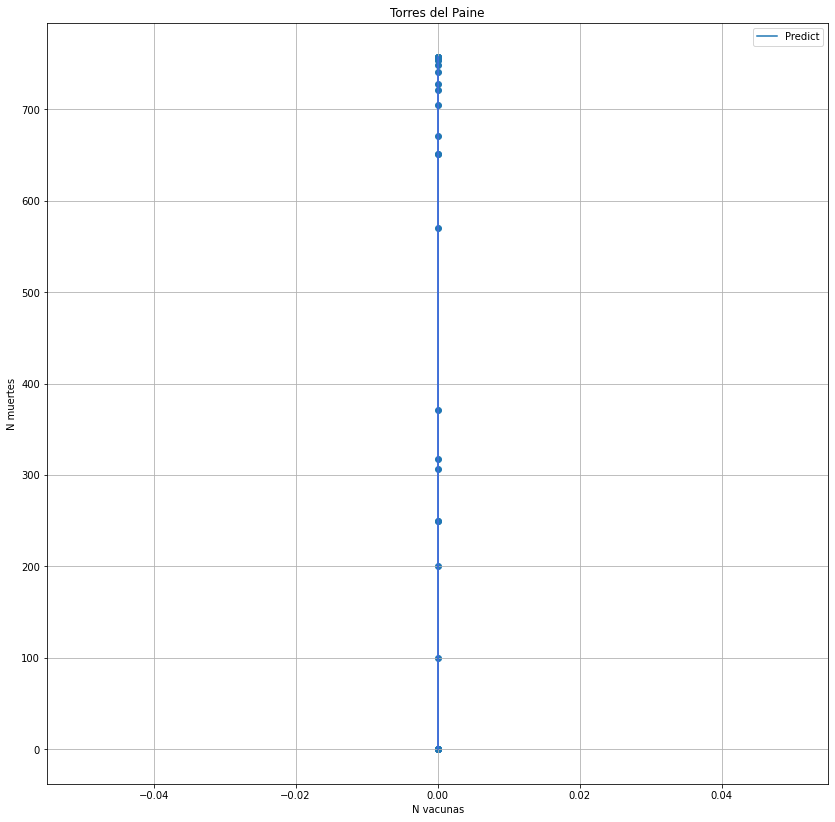

In [9]:
for i in muertesComuna.columns:
    muertes = muertesComuna[i].values.reshape(-1,1)
    vacunas = vacunasD1Comuna[i].values.reshape(-1,1)
    linear_regressor = LinearRegression()
    linear_regressor.fit(vacunas, muertes)
    muertes_pred= linear_regressor.predict(vacunas)
    fig = plt.figure(figsize=(14,14))
    plt.title(str(i))
    plt.scatter(muertesComuna[i],vacunasD1Comuna[i] )
    plt.plot(muertesComuna[i],vacunasD1Comuna[i], label='Predict' )
    plt.plot(muertes_pred, vacunas,  color='royalBlue')
    plt.xlabel("N vacunas")
    plt.ylabel("N muertes")
    plt.legend()
    plt.grid()


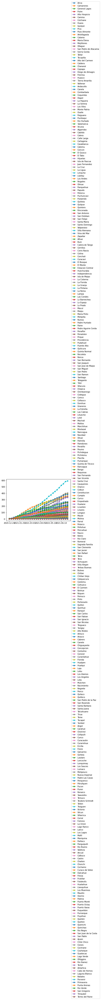

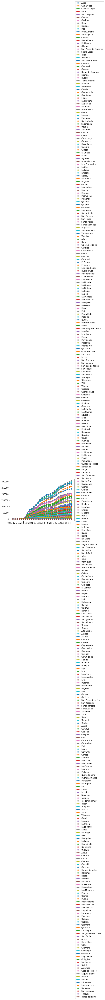

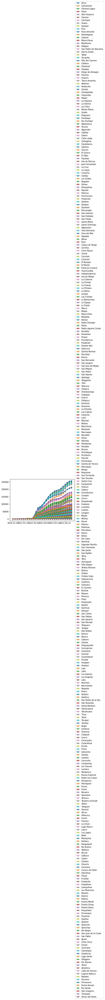

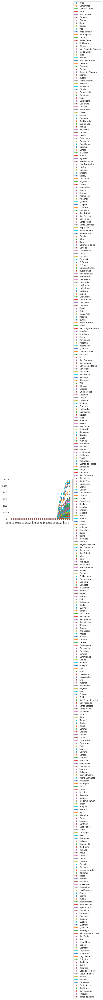

In [10]:
graficar(muertesComuna)
graficar(vacunasD1Comuna)
graficar(vacunasD2Comuna)
graficar(vacunasUDComuna)